In [135]:
# import scanpy as sc
# import pandas as pd 
# import numpy as np
# from scipy.sparse import csr_matrix
# import matplotlib.pyplot as plt



# #from nero import Harmonia
# from tqdm import tqdm_notebook as tqdm
# import warnings
# import itertools as it
# import pickle as pkl
# from copy import copy

# import matplotlib.patches as patches
# from shapely.geometry import Point
# from shapely.geometry.polygon import Polygon

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.cm as cm
import seaborn as sns
import numpy as np

import scanpy as sc
import scipy
import warnings
from tqdm.notebook import tqdm
import pickle as pkl
from matplotlib.patches import Polygon

import matplotlib as mpl
import seaborn as sns

In [379]:
# might need this, the most recent version of jupterlab I installed installed the most recent version of jedi which has been having problems with autocomplete
# see thread here: https://github.com/ipython/ipython/issues/10493
%config Completer.use_jedi = False
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80)

## Reading in Data

In [380]:
exps = dict()
for exp in range(5):
    exps[exp] = dict()

In [381]:
pwd

'/Users/derekbogdanoff/projects/XYZeq/Repo/spatial/notebooks/figures'

In [415]:
exps[0]['path'] = '../../../../data/h5_data/20180831_L10C.h5ad'
exps[1]['path'] = '../../../../data/h5_data/20190920_L20C1.h5ad'
exps[2]['path'] = '../../../../data/h5_data/20190920_L20T.h5ad'
exps[3]['path'] = '../../../../data/h5_data/20180831_L30C.h5ad'
exps[4]['path'] = '../../../../data/h5_data/20180831_L30C8.h5ad'

In [416]:
# exps[0]['path'] = '../../../../new_h5s/20200915_L10C.h5ad'
# exps[1]['path'] = '../../../../new_h5s/20200915_L20C1_rerun.h5ad'
# exps[2]['path'] = '../../../../new_h5s/20200915_L20T.h5ad'
# exps[3]['path'] = '../../../../new_h5s/20200915_L30C.h5ad'
#exps[4]['path'] = '../../../../new_h5s/h5_data/20180831_L30C8.h5ad'

In [417]:
for exp in exps:
    exps[exp]['adata'] = sc.read_h5ad(exps[exp]['path'])

In [418]:
for exp in exps:
    exps[exp]['label'] = exps[exp]['path'].split('/')[-1]

## Filtering for Cells, Labeling Human and Mouse Cells

In [419]:
adata = exps[0]['adata'].concatenate(exps[1]['adata'],
                                     exps[2]['adata'],
                                     exps[3]['adata'],
                                     exps[4]['adata'],
                                     join='inner').copy()

In [420]:
###################################################################################################

In [421]:
pip install loompy

Note: you may need to restart the kernel to use updated packages.


In [87]:
adata = sc.read_csv('../../../decont_mat/decont_mat_after_v2.csv').T

In [88]:
adata.obs.batch = adata.obs.index.str[-1:]

<ipython-input-88-418e3b5aaf49>:1: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  adata.obs.batch = adata.obs.index.str[-1:]


In [89]:
adata.var_names

Index(['hg19_FAM138A', 'hg19_OR4F5', 'hg19_RP11-34P13.7', 'hg19_AL627309.1',
       'hg19_RP11-34P13.14', 'hg19_AP006222.2', 'hg19_RP4-669L17.10',
       'hg19_OR4F29', 'hg19_RP4-669L17.2', 'hg19_RP5-857K21.15',
       ...
       'mm10_Ccl19-1', 'mm10_AC125178.2', 'mm10_AC125149.3', 'mm10_AC125149.1',
       'mm10_AC168977.2', 'mm10_AC168977.1', 'mm10_PISD', 'mm10_DHRSX',
       'mm10_Vmn2r122', 'mm10_CAAA01147332.1'],
      dtype='object', length=55287)

In [90]:
# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)

adata.obs['log_counts'] = np.log(adata.obs['n_counts'])

adata.obs['n_genes'] = (adata.X > 0).sum(1)

In [91]:
adata.obs['barcode'] = adata.obs.index.str[-18:-2]

In [92]:
adata.var_names_make_unique()

In [93]:
#sc.pl.highest_expr_genes(adata, n_top=100) 

In [94]:
# mito_genes_mouse=[name for name in adata.var_names if name.startswith(('mm10_mt-'))]
                                                              
# #mito_genes_human=[name for name in adata.var_names if name.startswith(('hg19_MT-'))] 

# adata.obs['percent_mito_mouse'] = np.sum(adata[:, mito_genes_mouse].X, axis=1) / np.sum(adata.X, axis=1)*100

#adata.obs['percent_mito_human'] = np.sum(adata[:, mito_genes_human].X, axis=1) / np.sum(adata.X, axis=1)*100

In [95]:
mito_genes_mouse=[name for name in adata.var_names if name.startswith(('mm10_mt-'))]
                                                              
#mito_genes_human=[name for name in adata.var_names if name.startswith(('hg19_MT-'))] 

adata.obs['percent_mito_mouse'] = np.sum(adata[:, mito_genes_mouse].X, axis=1) / np.sum(adata.X, axis=1)*100

#adata.obs['percent_mito_human'] = np.sum(adata[:, mito_genes_human].X, axis=1) / np.sum(adata.X, axis=1)*100

In [433]:
sc.pp.filter_cells(adata, min_counts = 500)

filtered out 53144 cells that have less than 500 counts


In [434]:
sc.pp.filter_cells(adata, min_genes = 100)

filtered out 176 cells that have less than 100 genes expressed


In [435]:
sc.pp.filter_genes(adata, min_cells=1)

filtered out 66126 genes that are detected in less than 1 cells


In [16]:
#adata.var['log_cells']=np.log10(adata.var['n_cells'])

KeyError: 'n_cells'

In [437]:
adata = adata[adata.obs['n_counts'] < 10000, :]

/Users/derekbogdanoff/miniconda3/envs/xyzeq/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [438]:
adata = adata[adata.obs['percent_mito_mouse'] < 1, :]

/Users/derekbogdanoff/miniconda3/envs/xyzeq/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [96]:
adata.obs.batch.value_counts()

1    4788
2    2950
3    1146
0     826
4     570
dtype: int64

In [97]:
# #barnyard


# mouse_genes=[name for name in adata.var_names if name.startswith('mm10_')]
# #human_genes=[name for name in adata.var_names if name.startswith('GRCh38_')]

# human_genes=[name for name in adata.var_names if name.startswith('hg19')]


# adata.obs['mouse_counts'] = np.sum(adata[:, mouse_genes].X, axis=1)
# adata.obs['human_counts'] = np.sum(adata[:, human_genes].X, axis=1)

In [98]:
#barnyard

mouse_genes=[name for name in adata.var_names if name.startswith('mm10_')]

#mouse_genes=[name for name in adata.var_names if name.startswith('mm10___')]
#human_genes=[name for name in adata.var_names if name.startswith('GRCh38_')]

human_genes=[name for name in adata.var_names if name.startswith('hg19_')]


adata.obs['mouse_counts'] = np.sum(adata[:, mouse_genes].X, axis=1)
adata.obs['human_counts'] = np.sum(adata[:, human_genes].X, axis=1)

In [99]:
cmap = mpl.colors.ListedColormap(['royalblue','lightgrey', 'orangered'])

np.seterr(divide = 'ignore') 
adata.obs['ratio'] = np.log10(np.true_divide(adata.obs['mouse_counts'], adata.obs['human_counts']))


def cell_call(counts):
        if counts['ratio'] > 0.66:
                return 'M'
        elif counts['ratio'] < -0.66:
                return 'H'
        else:
                return 'C'

         
adata.obs['cell_call']=adata.obs.apply(lambda counts: cell_call(counts), axis=1)



In [188]:
adata

AnnData object with n_obs × n_vars = 10280 × 55287
    obs: 'n_counts', 'log_counts', 'n_genes', 'barcode', 'percent_mito_mouse', 'mouse_counts', 'human_counts', 'ratio', 'cell_call'

In [509]:
# contam = pd.read_csv('../../../../contamination_analysis/est_contam_before.csv',
#                     index_col=0)
contam = pd.read_csv('../../../../contamination_analysis/est_contam_after.csv',
                    index_col=0)

In [515]:
contam.cell_iden.replace({'\.':'-'}, regex=True)

1         L10C-P1A01F-TCTCAGCTGCTTCTCC-0
2         L10C-P1A01F-CACTGGCGGTATTAGA-0
3         L10C-P1A01F-CCTTGTACAGGCATGA-0
4         L10C-P1A01F-CACGACCTCACGACTA-0
5         L10C-P1A01F-AGTAGAGTTATCGTCC-0
                      ...               
10272    L30C8-P4H08F-TATGCAGGTTCACTGT-4
10273    L30C8-P4H08F-CTGCTTCGGCCATCAG-4
10274    L30C8-P4H09F-CGTATTCTCTACTGAC-4
10275    L30C8-P4H10F-ATGGCAAGGTTCTATG-4
10276    L30C8-P4H12F-TAGGATTCCGGAACAC-4
Name: cell_iden, Length: 10276, dtype: object

In [516]:
adata.obs.index

Index(['L10C_P1A01F.TCTCAGCTGCTTCTCC-0', 'L10C_P1A01F.CACTGGCGGTATTAGA-0',
       'L10C_P1A01F.CCTTGTACAGGCATGA-0', 'L10C_P1A01F.CACGACCTCACGACTA-0',
       'L10C_P1A01F.AGTAGAGTTATCGTCC-0', 'L10C_P1A02F.ATTGACCAGAAGATGC-0',
       'L10C_P1A02F.GTAATGCTCTTACGGA-0', 'L10C_P1A03F.GCTTAATACACACTGC-0',
       'L10C_P1A03F.AGTCTCACTCCATAGT-0', 'L10C_P1A03F.GAGGTGATCTTCTCAA-0',
       ...
       'L30C8_P4H06F.GGTTAGTCACCACGGT-4', 'L30C8_P4H06F.CCTATCCTGGACTTGT-4',
       'L30C8_P4H06F.GTGTGGACAAGACTCA-4', 'L30C8_P4H06F.TCTCATCTGAGTGGCG-4',
       'L30C8_P4H07F.GGCATAAGCTCAACTC-4', 'L30C8_P4H08F.TATGCAGGTTCACTGT-4',
       'L30C8_P4H08F.CTGCTTCGGCCATCAG-4', 'L30C8_P4H09F.CGTATTCTCTACTGAC-4',
       'L30C8_P4H10F.ATGGCAAGGTTCTATG-4', 'L30C8_P4H12F.TAGGATTCCGGAACAC-4'],
      dtype='object', name='index', length=10280)

In [455]:
contam.columns = ['cell_iden','CellType','contam_post']

In [457]:
adata.obs['contam_post']=contam.contam_init

In [318]:
contam = pd.read_csv('../../../../contamination_analysis/est_contam_after.csv',
                    index_col=0)

In [101]:
adata_m = adata[adata.obs.cell_call == 'M']

In [102]:
adata_m.raw = adata_m

In [103]:
adata_m.raw = sc.pp.log1p(adata_m, copy=True)

In [104]:
sc.pp.normalize_per_cell(adata_m, counts_per_cell_after=1e4)

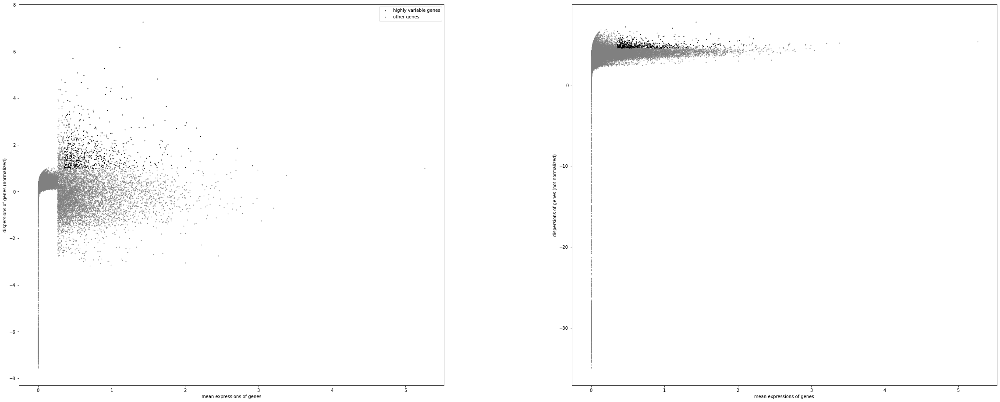

In [105]:
filter_result = sc.pp.filter_genes_dispersion(
    adata_m.X,
#     n_top_genes=2000
    min_mean=0.35,
    max_mean=7,
    min_disp=1
                                            ) 


####L20C1 parameters 

sc.pl.filter_genes_dispersion(filter_result)

In [106]:
adata_m = adata_m[:, filter_result.gene_subset]

/Users/derekbogdanoff/miniconda3/envs/xyzeq/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [107]:
sc.pp.log1p(adata_m)

/Users/derekbogdanoff/miniconda3/envs/xyzeq/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:339: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [108]:
#Regress out unwanted sources of variation
sc.pp.regress_out(adata_m, ['n_counts',
#                           'percent_mito_human',
                           'percent_mito_mouse',
              #            'percent_contam'
                         ])

/Users/derekbogdanoff/miniconda3/envs/xyzeq/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'barcode' as categorical
... storing 'cell_call' as categorical


In [109]:
sc.pp.scale(adata_m, max_value=10)

In [110]:
sc.tl.pca(adata_m,
          svd_solver='arpack'
         )

In [111]:
sc.tl.tsne(adata_m,
           n_pcs=13,
        #    early_exaggeration=10
          )

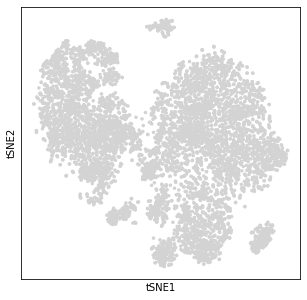

In [112]:
plt.rcParams['figure.figsize'] = [5, 5]

sc.pl.tsne(adata_m,
           ncols=1,
           palette='tab10',
           
           size=50
          )

In [113]:
sc.pp.neighbors(adata_m, 
                n_neighbors=10,
                n_pcs=15)

In [114]:
sc.tl.leiden(adata_m, resolution=0.6)

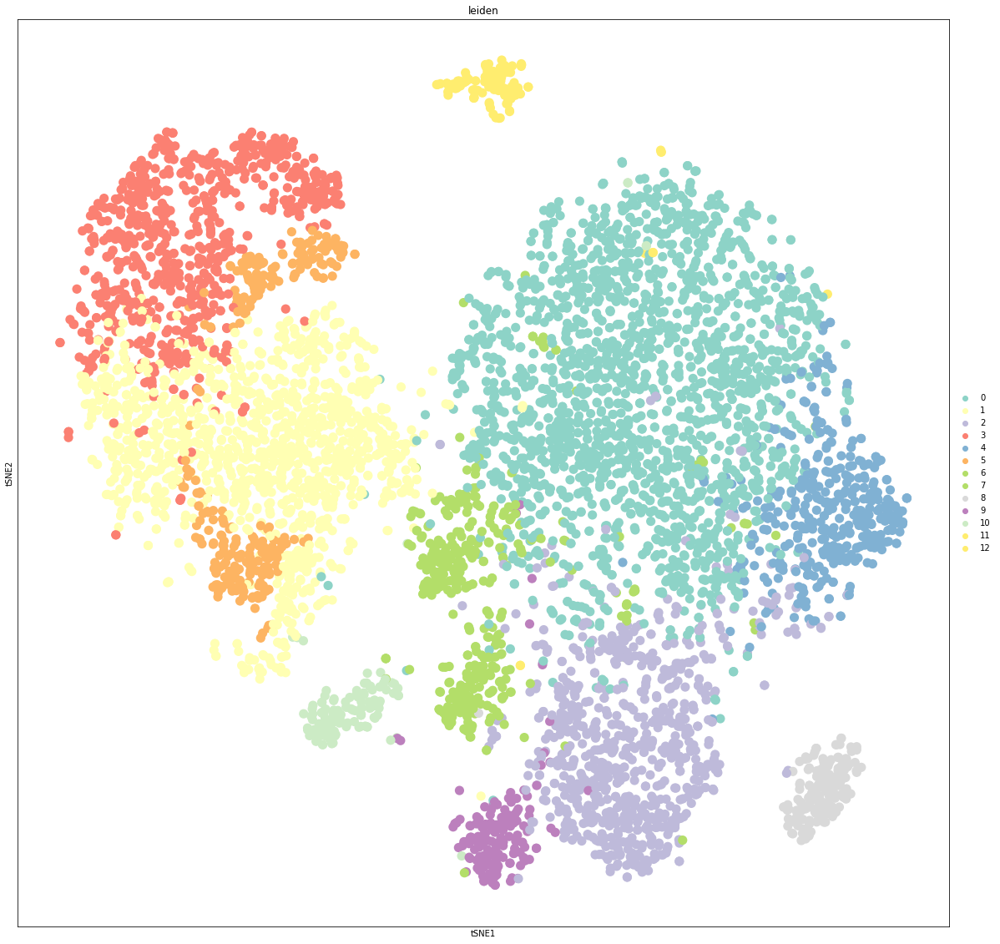

In [115]:
plt.rcParams['figure.figsize'] = [20, 20]

sc.pl.tsne(adata_m,
          color=['leiden',
                 
          ],
           ncols=2,
           palette='Set3',
           
           size=500
          )

In [157]:
adata_m.obs['batch'] = adata_m.obs.index.str[-1:]

In [186]:
adata.obs.columns.tolist()

['n_counts',
 'log_counts',
 'n_genes',
 'barcode',
 'percent_mito_mouse',
 'mouse_counts',
 'human_counts',
 'ratio',
 'cell_call']

In [194]:
sc.tl.umap(adata_m,          
             min_dist=.5,
             spread=5,
             alpha=5,
            )

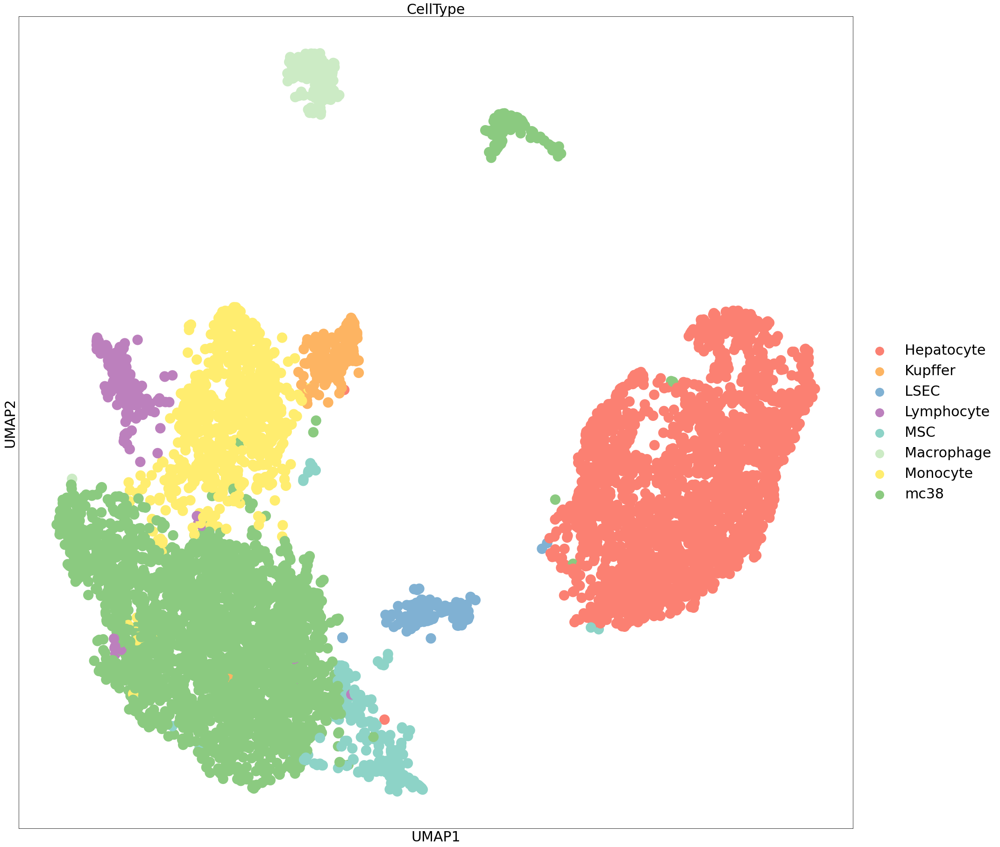

In [195]:
plt.rcParams['figure.figsize'] = [32, 32]
plt.rcParams['legend.fontsize'] = 30
plt.rcParams['legend.markerscale'] = 3
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['axes.titlesize'] = 30

sc.pl.umap(adata_m, 
           color='CellType'
                 ,
           ncols=1,
           #palette='Set3',
           color_map=mpl.cm.CMRmap,
      #     legend_loc='on data',
           size=2000)

In [135]:
sc.tl.rank_genes_groups(adata_m,groupby='leiden')

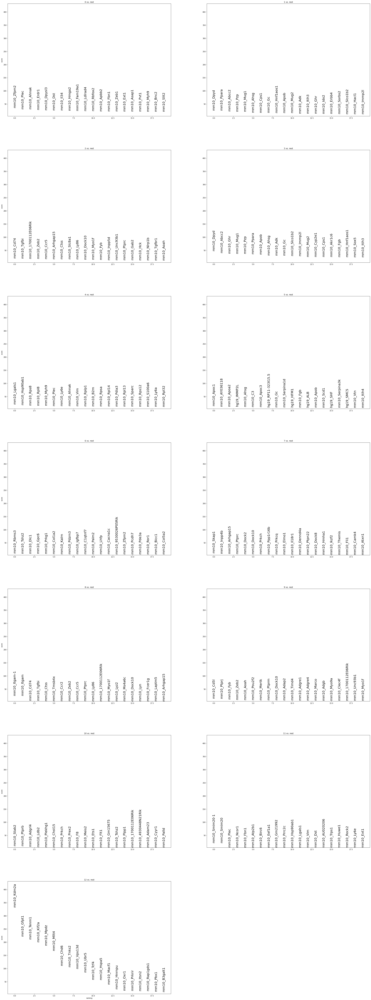

In [136]:
sc.pl.rank_genes_groups(adata_m,
                       fontsize=20,
                       ncols=2)

In [144]:
cell_type_df=pd.DataFrame(adata_m.obs['leiden'])

def label (row):
   if row['leiden'] == '0':
      return 'mc38'
   if row['leiden'] =='1':
      return 'Hepatocyte'
   if row['leiden'] == '2':
      return 'Monocyte'
   if row['leiden'] == '3':
      return 'Hepatocyte'
   if row['leiden']  == '4':
      return 'mc38'
   if row['leiden'] == '5':
      return 'Hepatocyte'
   if row['leiden'] == '6':
      return 'MSC'
   if row['leiden'] == '7':
      return 'Lymphocyte'
   if row['leiden'] == '8':
      return 'Macrophage'
   if row['leiden'] == '9':
      return 'Kupffer'
   if row['leiden'] == '10': 
      return 'LSEC'
   if row['leiden'] == '11':    
      return 'mc38'
   if row['leiden'] == '12':    
      return 'mc38'

    
cell_type_df_ =  pd.DataFrame(cell_type_df.apply (lambda row: label(row), axis=1),)

cell_type_df_.columns=['CellType']

adata_m.obs['CellType']=cell_type_df_

In [147]:
adata_m.uns['CellType_colors']=[
# '#d9d9d9',    #Hek293t   Grey
 '#fb8072', #Hepatocyte   Red
 '#fdb462', #Kupffer   Orange
 '#80b1d3', #LSEC   Blue
 '#bc80bd', #Lymphocyte   Purple 
 '#8dd3c7',#MSC    Cyan 
 '#ccebc5', #Macrophage   Light Green
 '#ffed6f',#mc38    Yellow
 '#8bca80'
]

In [487]:
[i for i in adata_m.raw.var_names if i.startswith('mm10_Epcam')]

['mm10_Epcam']

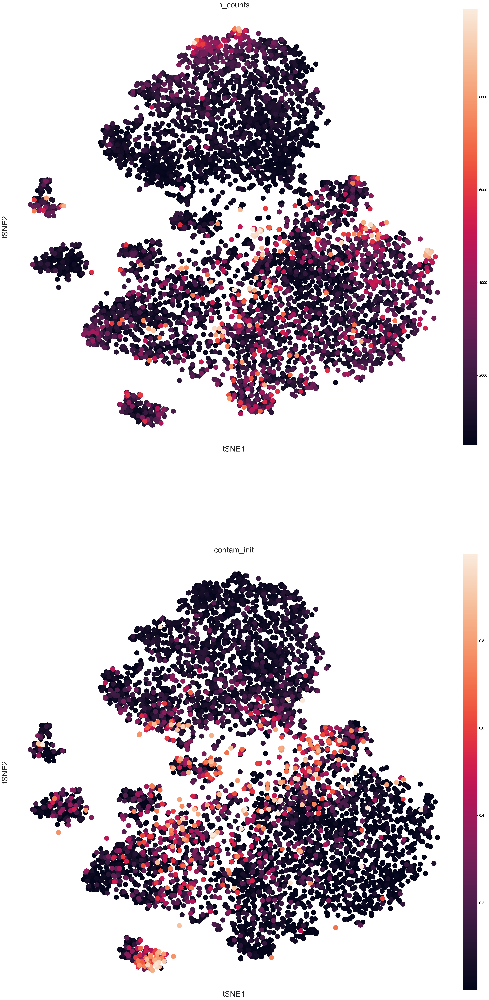

In [499]:
plt.rcParams['figure.figsize'] = [32, 32]
plt.rcParams['legend.fontsize'] = 30
plt.rcParams['legend.markerscale'] = 3
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['axes.titlesize'] = 30
sc.pl.tsne(adata_m,
          color=['n_counts','contam_init'],
    
           ncols=1,
           size=1500
          )

<AxesSubplot:xlabel='percent_mito_mouse', ylabel='contam_init'>

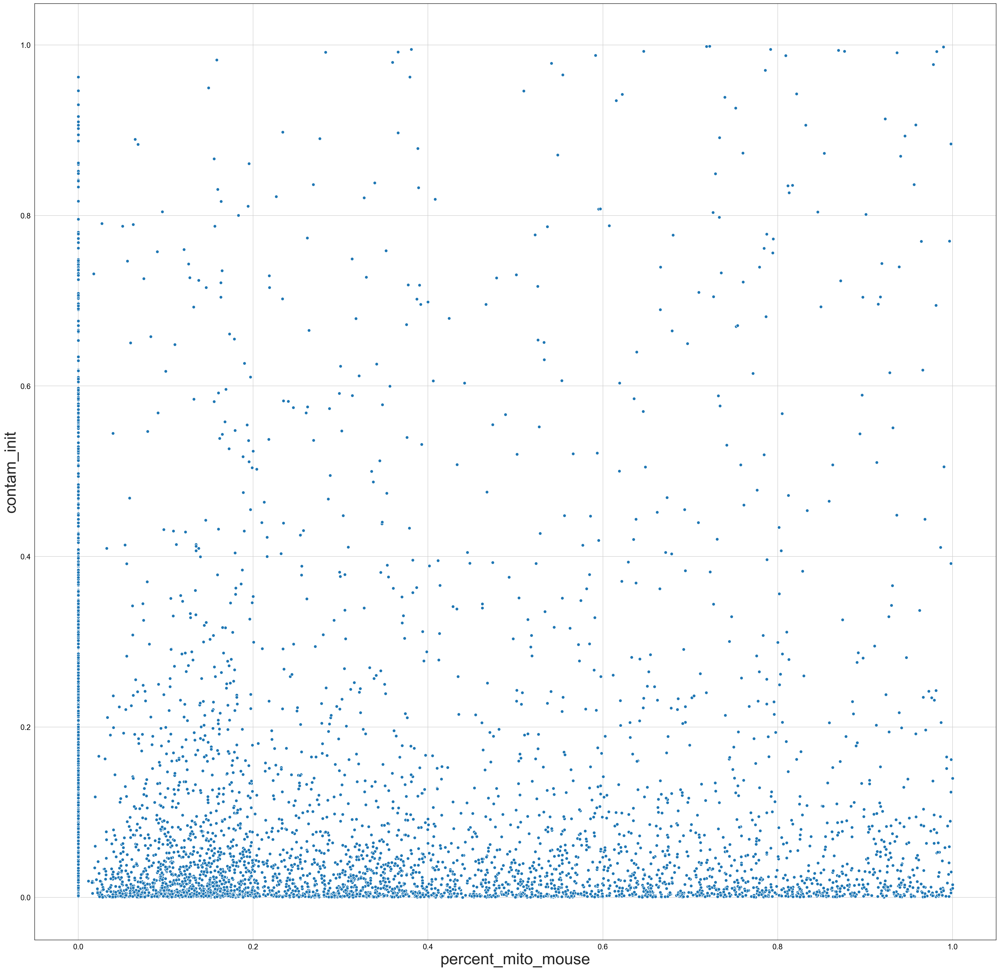

In [508]:
sns.scatterplot(y=adata_m.obs.contam_init,
               x=adata_m.obs.percent_mito_mouse)

In [49]:
##get plate map file 
plate_map='~/projects/XYZeq/data/20181219_species_exp/plate23_map.csv'


spatial_map=pd.read_csv(plate_map, header=None, names=['barcode', 'X', 'Y'])

spatial_map['Y'] = -spatial_map['Y']

tmp=[]

for index, row in spatial_map.iterrows():
    if row['X']%2==0:
        m=row['Y'] - .5
        tmp.append(m)
    else:
        tmp.append(row['Y'])
        
spatial_map['Y_offset'] = pd.DataFrame(tmp)

spatial_map = spatial_map.drop(['Y'],axis=1)

spatial_map.columns = ['barcode','X','Y']


In [50]:
adata_m.obs = adata_m.obs.reset_index().merge(spatial_map, on='barcode',how='left').set_index('index')

In [81]:
adata_batch2 = adata_m[adata_m.obs.batch == '2']

/Users/derekbogdanoff/miniconda3/envs/xyzeq/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


/Users/derekbogdanoff/miniconda3/envs/xyzeq/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/Users/derekbogdanoff/miniconda3/envs/xyzeq/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/Users/derekbogdanoff/miniconda3/envs/xyzeq/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/Users/derekbogdanoff/miniconda3/envs/xyzeq/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
 

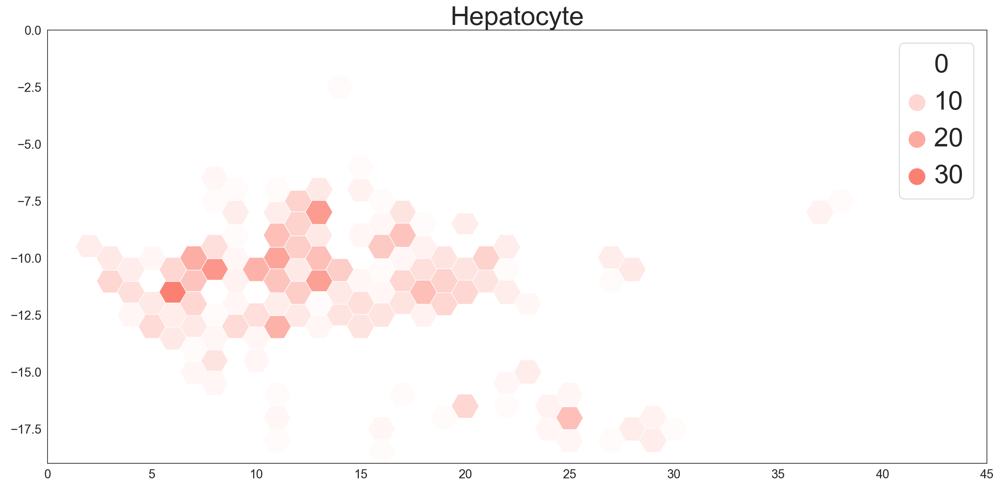

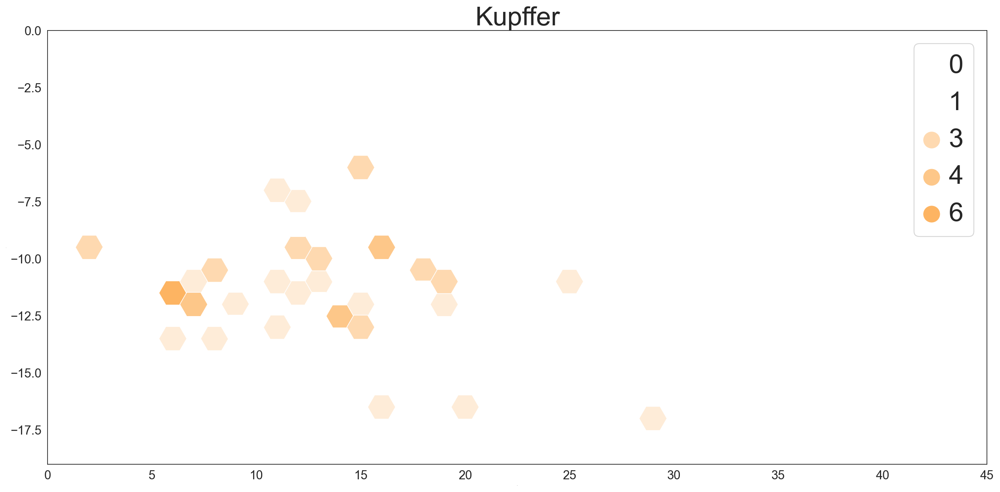

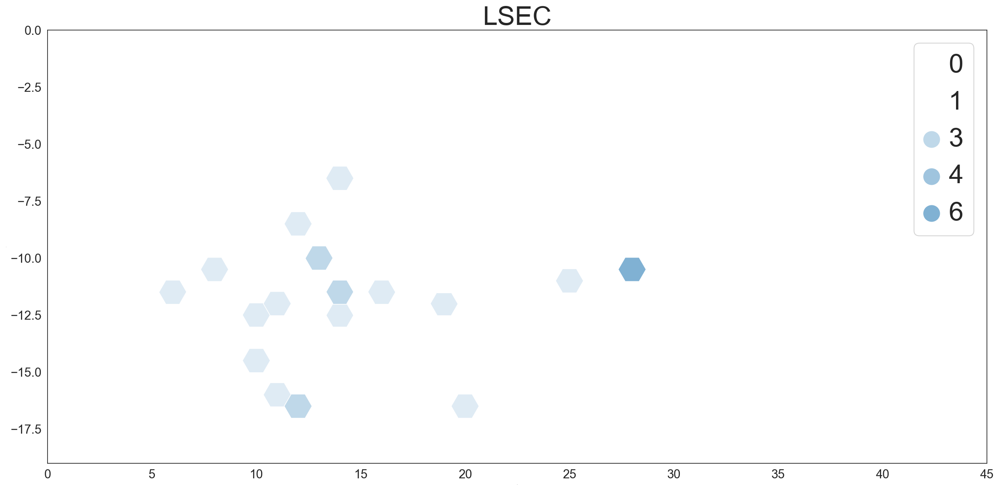

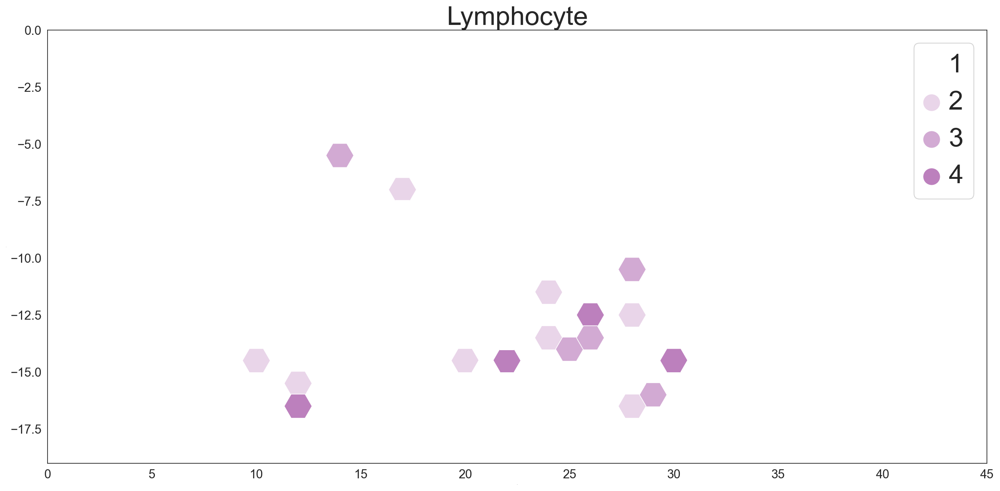

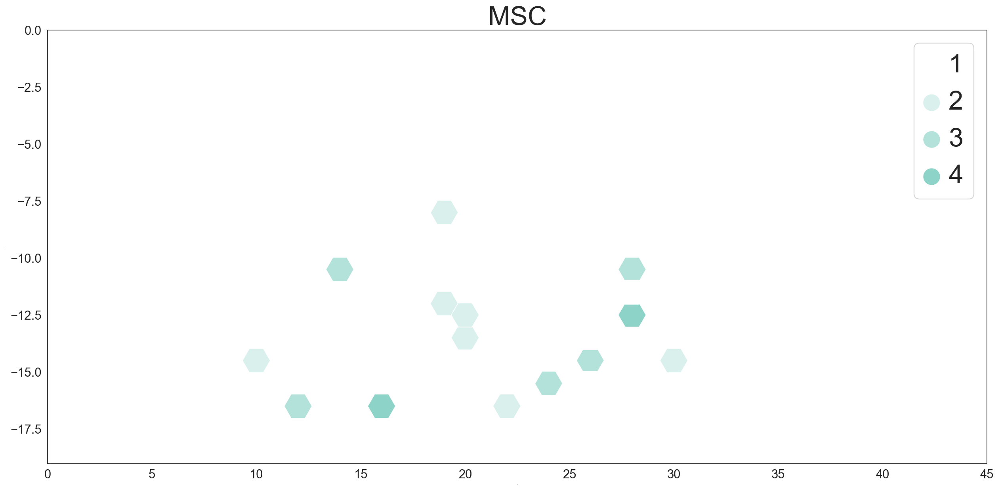

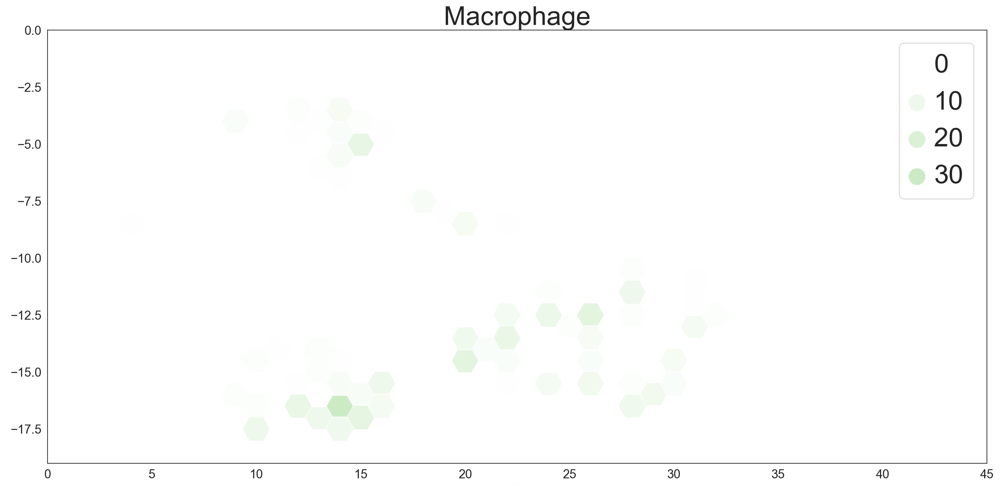

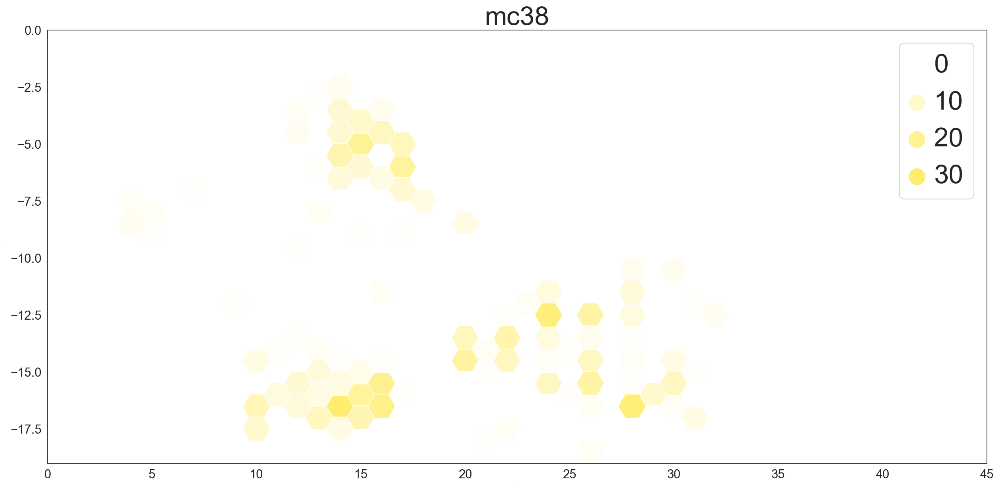

<Figure size 1520x720 with 0 Axes>

In [93]:
#plt.rcParams['figure.figsize'] = [19, 9]

plt.rcParams['legend.fontsize'] = 30
plt.rcParams['legend.markerscale'] = 3
plt.rcParams['axes.labelsize'] = 0
plt.rcParams['axes.titlesize'] = 30



sns.set_style("white", {'axes.grid' : False})

#sns.despine(trim=True)

#fig, axs = plt.subplots(ncols=3, nrows=3, figsize=(9, 6))


for i in adata_m.obs.CellType.cat.categories:

    plt.xlim(0, 45)
    plt.ylim(-19,0)
    
    cell_type_color = adata_batch1[adata_batch1.obs.CellType == i].uns['CellType_colors'].item()
    cell_type_color_map = mpl.colors.LinearSegmentedColormap.from_list("", ["#ffffff",cell_type_color])

    g = sns.scatterplot(data=adata_batch1[adata_batch1.obs.CellType == i].obs.groupby(['barcode','X','Y']).size().reset_index(name="count"),
                x='X',
                y='Y',
                marker="H",
                s=1000,
                hue=adata_batch1[adata_batch1.obs.CellType == i].obs.groupby(['barcode','X','Y']).size().reset_index(name="count")['count'].tolist(),
                palette=cell_type_color_map,
                legend='brief'
                        ###for solid colors:
                #c=[cell_type_color]#[adata_batch1[adata_batch1.obs.CellType == i].uns['CellType_colors'].item()]

               )

    #g.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
    g.set_title(i)
    plt.figure()
    

    


In [104]:
adata_m

AnnData object with n_obs × n_vars = 6567 × 775
    obs: 'batch', 'n_counts', 'log_counts', 'n_genes', 'barcode', 'percent_mito_mouse', 'mouse_counts', 'human_counts', 'ratio', 'cell_call', 'leiden', 'CellType', 'X', 'Y'
    var: 'n_cells', 'log_cells', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'leiden', 'leiden_colors', 'rank_genes_groups', 'CellType_colors'
    obsm: 'X_pca', 'X_tsne'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [105]:
#adata_m_xyz = adata_m